In [ ]:
!pwd

/content


In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [3]:
from google.colab import files
files.upload()

In [ ]:
%mkdir drone_dataset

In [ ]:
%cd drone_dataset/

/content/drive/MyDrive/drone_dataset


In [ ]:
files.upload()

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 809 kB/s 
     |████████████████████████████████| 49 kB 1.4 MB/s 
     |████████████████████████████████| 130 kB 3.7 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 145 kB 19.1 MB/s 
     |████████████████████████████████| 843 kB 31.3 MB/s 
     |████████████████████████████████| 749 kB 44.3 MB/s 
     |████████████████████████████████| 112 kB 48.9 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=a66820c2d884a435a68d25c369617edde6066dc5dbadd58197cfc92adaab99c0
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=ca009dc86ffd738ec905036eb6aa359954

In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("Drone_Dataset", {}, "/content/drive/MyDrive/trainval.json", "/content/drive/MyDrive/drone_dataset/train/")

In [ ]:
from detectron2.data import DatasetCatalog
DatasetCatalog.get("Drone_Dataset")

In [ ]:
from detectron2.data import MetadataCatalog
MetadataCatalog.get("Drone_Dataset").thing_classes = ["Car","Human","Truck","Van"]

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
# %cd MyDrive

In [ ]:
# from google.colab import drive
# GDRIVE_ROOT = '/drive'
# drive.mount(GDRIVE_ROOT)

In [ ]:
# !cat /content/drive/MyDrive/trainval.json

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("Drone_Dataset",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/22 13:27:09 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:18, 9.81MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[12/22 13:27:32 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/22 13:28:04 d2.utils.events]:  eta: 0:07:08  iter: 19  total_loss: 2.858  loss_cls: 1.489  loss_box_reg: 0.6161  loss_mask: 0.694  loss_rpn_cls: 0.03362  loss_rpn_loc: 0.01638  time: 1.4977  data_time: 0.0565  lr: 1.6068e-05  max_mem: 2673M
[12/22 13:28:34 d2.utils.events]:  eta: 0:06:49  iter: 39  total_loss: 2.469  loss_cls: 1.239  loss_box_reg: 0.5868  loss_mask: 0.6787  loss_rpn_cls: 0.0411  loss_rpn_loc: 0.0125  time: 1.5186  data_time: 0.0071  lr: 3.2718e-05  max_mem: 2673M
[12/22 13:29:04 d2.utils.events]:  eta: 0:06:12  iter: 59  total_loss: 2.116  loss_cls: 0.8098  loss_box_reg: 0.6168  loss_mask: 0.6391  loss_rpn_cls: 0.0231  loss_rpn_loc: 0.01621  time: 1.5104  data_time: 0.0070  lr: 4.9367e-05  max_mem: 2673M
[12/22 13:29:34 d2.utils.events]:  eta: 0:05:42  iter: 79  total_loss: 1.839  loss_cls: 0.5651  loss_box_reg: 0.6334  loss_mask: 0.5857  loss_rpn_cls: 0.01375  loss_rpn_loc: 0.01388  time: 1.5039  data_time: 0.0074  lr: 6.6017e-05  max_mem: 2673M
[12/22 13:30:04 d2

In [ ]:
%cd drive/MyDrive/drone_dataset

/content/drive/MyDrive/drone_dataset


In [ ]:
%mkdir test

In [ ]:
%cd test

/content/drive/MyDrive/drone_dataset/test


In [ ]:
from google.colab import files
files.upload()

Saving street-view-from-above-New-York.jpg to street-view-from-above-New-York.jpg
Saving cars_2.jpg to cars_2 (1).jpg
Saving new_cars.png to new_cars (1).png
Saving frame_20190905143505_x_0001874.jpg to frame_20190905143505_x_0001874.jpg
Saving frame_20190906150731_x_0000607.jpg to frame_20190906150731_x_0000607 (1).jpg
Saving frame_20190905103112_x_0002277.jpg to frame_20190905103112_x_0002277 (1).jpg
Saving Wien_-_Graben_(2).JPG to Wien_-_Graben_(2).JPG
Saving street-road-intersection-from-above.jpg to street-road-intersection-from-above.jpg


In [ ]:
%cd /content/

/content


In [ ]:
!cp -av /content/output /content/drive/MyDrive/drone_dataset

'/content/output' -> '/content/drive/MyDrive/drone_dataset/output'
'/content/output/metrics.json' -> '/content/drive/MyDrive/drone_dataset/output/metrics.json'
'/content/output/events.out.tfevents.1640179632.19ba529bc1ed.400.0' -> '/content/drive/MyDrive/drone_dataset/output/events.out.tfevents.1640179632.19ba529bc1ed.400.0'
'/content/output/model_final.pth' -> '/content/drive/MyDrive/drone_dataset/output/model_final.pth'
'/content/output/last_checkpoint' -> '/content/drive/MyDrive/drone_dataset/output/last_checkpoint'


In [ ]:
%cd /content/drive/MyDrive/drone_dataset

/content/drive/MyDrive/drone_dataset


In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


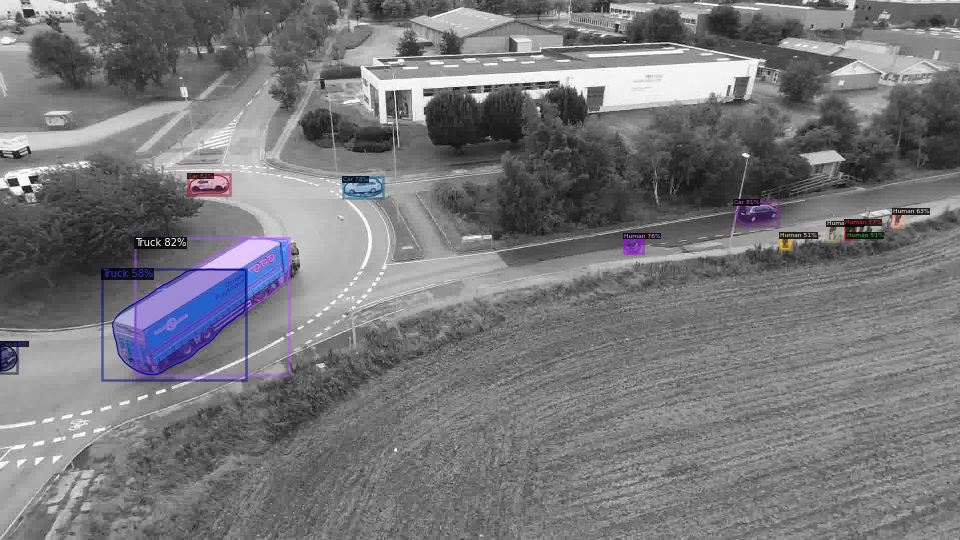

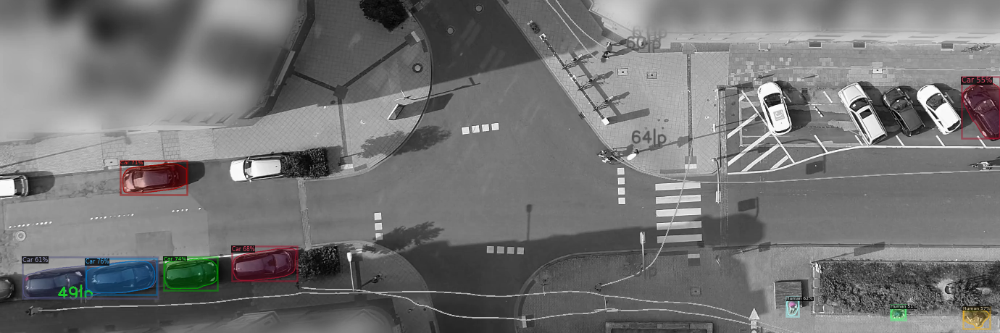

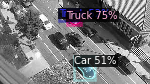

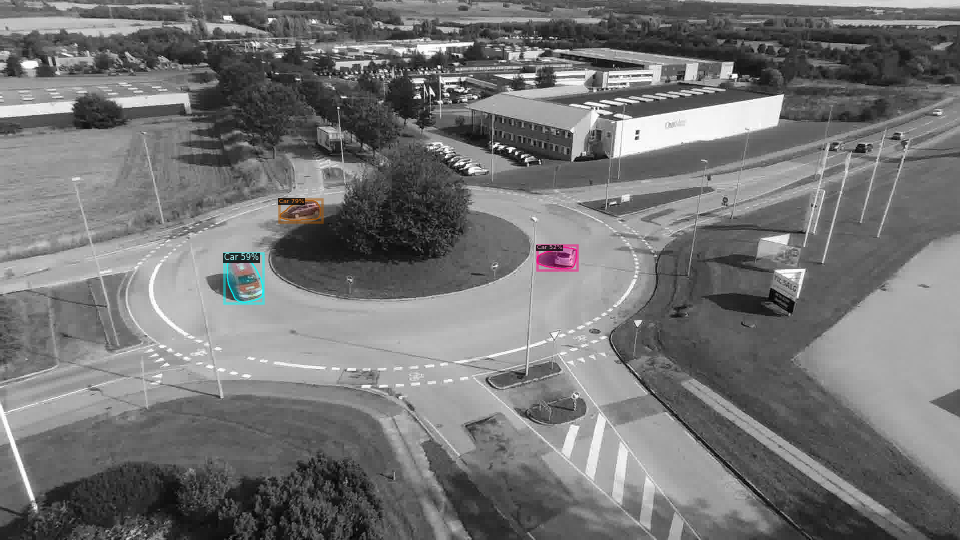

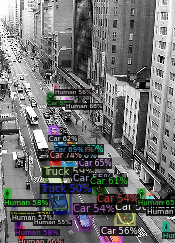

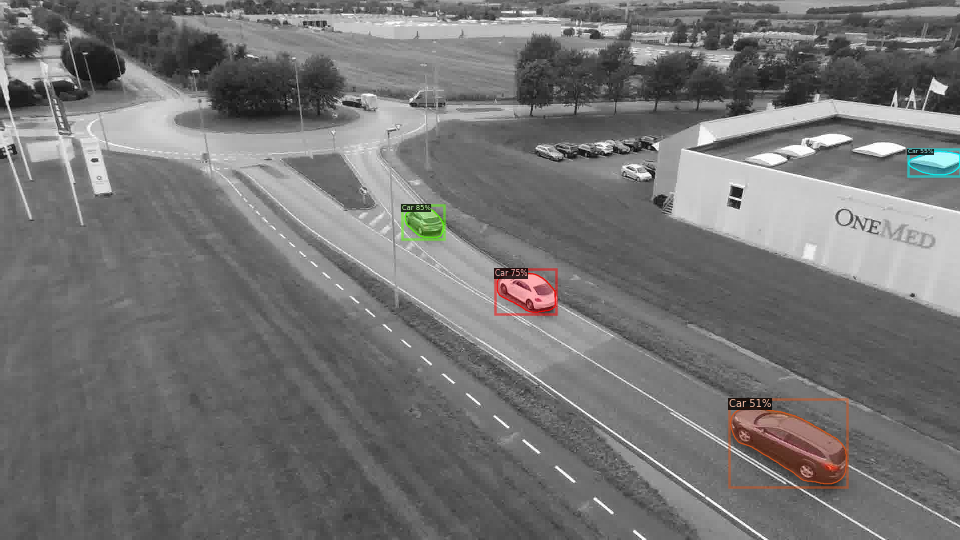

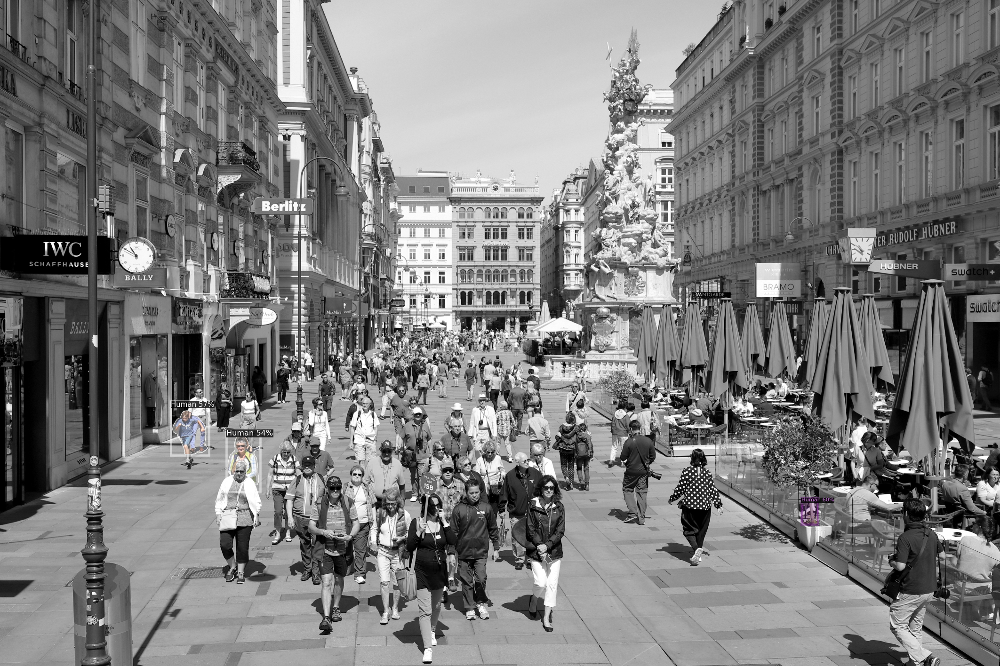

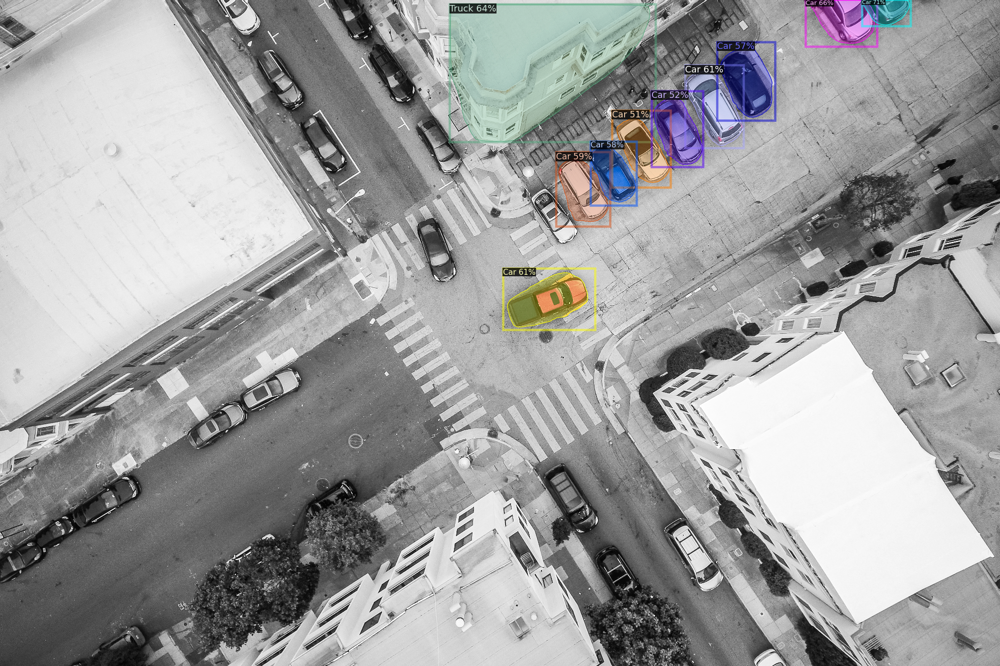

In [ ]:
from detectron2.utils.visualizer import ColorMode
import os
import PIL
drone_metadata = MetadataCatalog.get("Drone_Dataset")
for root, __, files in os.walk("/content/drive/MyDrive/drone_dataset/test"):
    for f in files:
        # print(f)
        im = cv2.imread("/content/drive/MyDrive/drone_dataset/test/"+f)
        outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
        v = Visualizer(im[:, :, ::-1],
                        metadata=drone_metadata, 
                        scale=0.5, 
                        instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
        )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])
        print("\n\n\n\n")